## Part A
__DOMAIN:__ Automobile

__CONTEXT:__ The data concerns city-cycle fuel consumption in miles per gallon to be predicted in terms of 3 multivalued discrete and 5
continuous attributes.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

**1. Data Understanding & Exploration**

In [2]:
# A. Read ‘Car name.csv’ as a DataFrame and assign it to a variable 
df_car_data =  pd.read_csv("Car-name.csv")
# B. Read ‘Car-Attributes.json as a DataFrame and assign it to a variable
df_car_attribute_data =  pd.read_json("Car-Attributes.json")

#print shape
print("Car name:", df_car_data.shape)
print("Car Attribue:", df_car_attribute_data.shape)

Car name: (398, 1)
Car Attribue: (398, 8)


In [3]:
df_car_data.head()

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [4]:
df_car_attribute_data.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [5]:
# C. Merge both the DataFrames together to form a single DataFrame 
df_car_data = pd.concat([df_car_data, df_car_attribute_data], axis=1, join="inner") 

In [6]:
df_car_data

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1
...,...,...,...,...,...,...,...,...,...
393,ford mustang gl,27.0,4,140.0,86,2790,15.6,82,1
394,vw pickup,44.0,4,97.0,52,2130,24.6,82,2
395,dodge rampage,32.0,4,135.0,84,2295,11.6,82,1
396,ford ranger,28.0,4,120.0,79,2625,18.6,82,1


In [7]:
#checking Intire Dataset Null values and count null
print("Is Null Value:", df_car_data.isnull().values.any())
print("\nCount Null Value:", df_car_data.isnull().sum().sum())

Is Null Value: False

Count Null Value: 0


In [8]:
df_car_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


In [9]:
#as i see the hp = data type is Object cheking uniqe values 
# Check for unexpected values in all the features and datapoints with such values.
print(" hp",df_car_data.hp.unique())
print("\n mpg",df_car_data.mpg.unique())
print("\n cyl",df_car_data.cyl.unique())
print("\n disp",df_car_data.disp.unique())
print("\n wt",df_car_data.wt.unique())
print("\n acc",df_car_data.acc.unique())


 hp [130 165 150 140 198 220 215 225 190 170 160 95 97 85 88 46 87 90 113 200
 210 193 '?' 100 105 175 153 180 110 72 86 70 76 65 69 60 80 54 208 155
 112 92 145 137 158 167 94 107 230 49 75 91 122 67 83 78 52 61 93 148 129
 96 71 98 115 53 81 79 120 152 102 108 68 58 149 89 63 48 66 139 103 125
 133 138 135 142 77 62 132 84 64 74 116 82]

 mpg [18.  15.  16.  17.  14.  24.  22.  21.  27.  26.  25.  10.  11.   9.
 28.  19.  12.  13.  23.  30.  31.  35.  20.  29.  32.  33.  17.5 15.5
 14.5 22.5 24.5 18.5 29.5 26.5 16.5 31.5 36.  25.5 33.5 20.5 30.5 21.5
 43.1 36.1 32.8 39.4 19.9 19.4 20.2 19.2 25.1 20.6 20.8 18.6 18.1 17.7
 27.5 27.2 30.9 21.1 23.2 23.8 23.9 20.3 21.6 16.2 19.8 22.3 17.6 18.2
 16.9 31.9 34.1 35.7 27.4 25.4 34.2 34.5 31.8 37.3 28.4 28.8 26.8 41.5
 38.1 32.1 37.2 26.4 24.3 19.1 34.3 29.8 31.3 37.  32.2 46.6 27.9 40.8
 44.3 43.4 36.4 44.6 40.9 33.8 32.7 23.7 23.6 32.4 26.6 25.8 23.5 39.1
 39.  35.1 32.3 37.7 34.7 34.4 29.9 33.7 32.9 31.6 28.1 30.7 24.2 22.4
 34.  38.  44. 

In [10]:
#changing ? mark outliner and putting mean values
df_car_data['hp'] = df_car_data['hp'].replace(['?'],'NaN').astype(float)
df_car_data.hp.fillna(df_car_data.hp.mean(),inplace=True)
df_car_data.hp = df_car_data.hp.astype(int)

In [11]:
df_car_data.hp.unique()

array([130, 165, 150, 140, 198, 220, 215, 225, 190, 170, 160,  95,  97,
        85,  88,  46,  87,  90, 113, 200, 210, 193, 104, 100, 105, 175,
       153, 180, 110,  72,  86,  70,  76,  65,  69,  60,  80,  54, 208,
       155, 112,  92, 145, 137, 158, 167,  94, 107, 230,  49,  75,  91,
       122,  67,  83,  78,  52,  61,  93, 148, 129,  96,  71,  98, 115,
        53,  81,  79, 120, 152, 102, 108,  68,  58, 149,  89,  63,  48,
        66, 139, 103, 125, 133, 138, 135, 142,  77,  62, 132,  84,  64,
        74, 116,  82])

In [12]:
df_car_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    int64  
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(5), object(1)
memory usage: 28.1+ KB


In [13]:
df_car_data = df_car_data.drop('car_name',axis=1)

In [14]:
# D. Print 5 point summary of the numerical features and share insights.
df_car_data.describe()

,mpg,cyl,disp,hp,wt,acc,yr,origin
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,104.462312,2970.424623,15.568090,76.010050,1.572864
std,7.815984,1.701004,104.269838,38.199230,846.841774,2.757689,3.697627,0.802055
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.250000,76.000000,2223.750000,13.825000,73.000000,1.000000
50%,23.000000,4.000000,148.500000,95.000000,2803.500000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,125.000000,3608.000000,17.175000,79.000000,2.000000
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,82.000000,3.000000


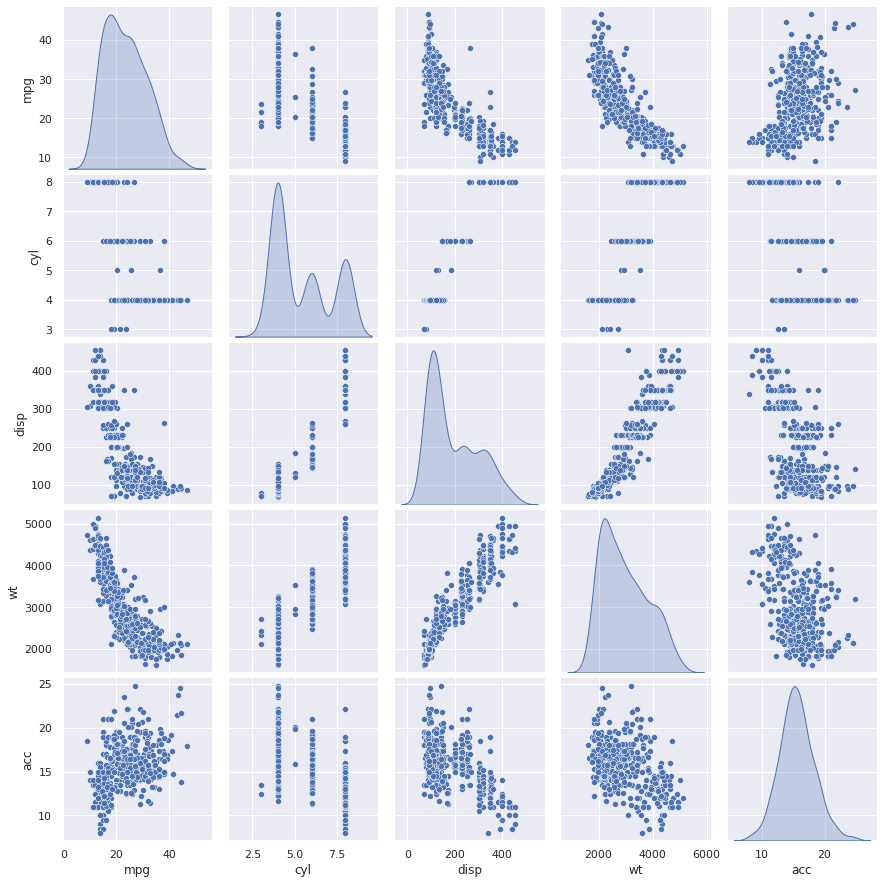

In [15]:
#showing 5 item data relation iside
#showing  pairpot Graphically and  miles per galon for the analysis and data structure
sns.pairplot(df_car_attribute_data[["mpg", "cyl", "disp", "wt","acc"]], diag_kind="kde")
plt.show()

## 2. Data Preparation & Analysis

In [16]:
#A. Check and print feature-wise percentage of missing values present in the data and impute with the best suitable approach
percent_missing = df_car_data.isnull().sum() * 100 / len(df_car_data)
percent_missing

mpg       0.0
cyl       0.0
disp      0.0
hp        0.0
wt        0.0
acc       0.0
yr        0.0
origin    0.0
dtype: float64

In [17]:
#B. Check for duplicate values in the data and impute with the best suitable approach
df_duplicate = df_car_data.duplicated()
df_duplicate

0      False
1      False
2      False
3      False
4      False
       ...  
393    False
394    False
395    False
396    False
397    False
Length: 398, dtype: bool

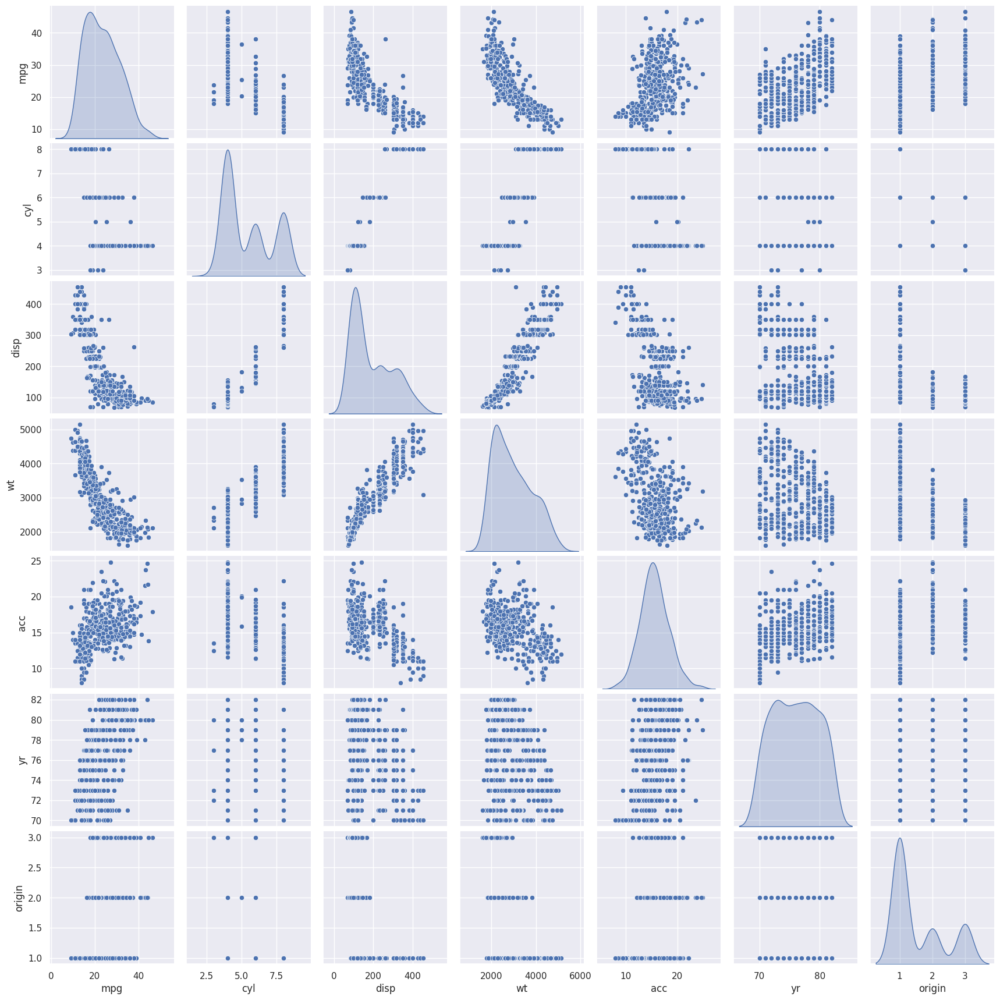

In [18]:
#C. Plot a pairplot for all features.
#showing  pairpot Graphically and  miles per galon for the analysis and data structure
sns.pairplot(df_car_attribute_data,diag_kind='kde')
plt.show()

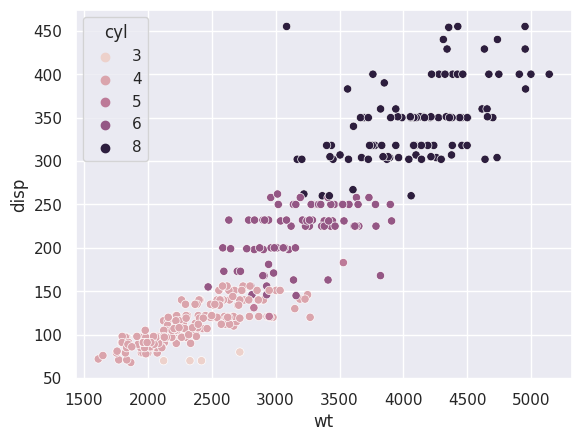

In [19]:
#D. Visualize a scatterplot for ‘wt’ and ‘disp’. Datapoints should be distinguishable by ‘cyl’
sns.scatterplot(data=df_car_data, x="wt", y="disp", hue="cyl")
plt.show()


Here you can see the 8 cylinder car have different weight of displament and more weight Hight displacment as well  and less cylinder car have less weight and displacement and more cylinder have  more wight and displacement. this is positive cruve line data

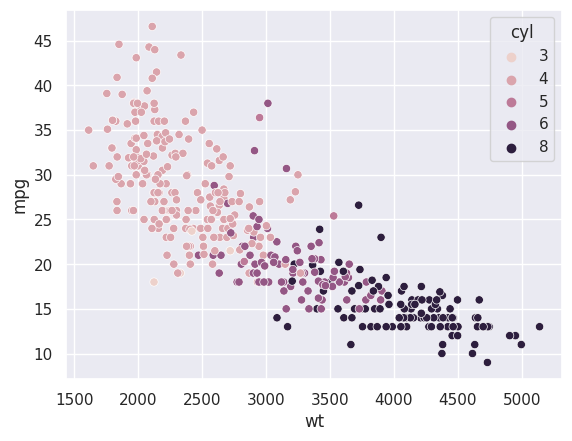

In [20]:
#F. Visualize a scatterplot for ‘wt’ and ’mpg’. Datapoints should be distinguishable by ‘cyl’
sns.scatterplot(data=df_car_data, x="wt", y="mpg", hue="cyl")
plt.show()

Here you can see the 8 cylinder car have different weight of mpg(mile per galon) and data says more weight have less mpg(miles per galon) and Less weight have more mpg and Less cyliner have more mpg and Less wight  and The more cylinder have a less mpg and more weight.
This is nagative curve line data


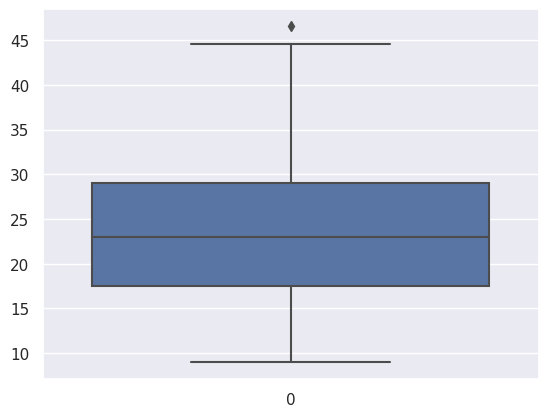

In [21]:
# one of data have outlier can see for mpg 45
sns.boxplot(data=df_car_data.mpg)
plt.show()

## Clustering Model Applying

In [22]:
from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans
from scipy.stats import zscore
# pip install yellowbrick for Elbo method optimizer
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score

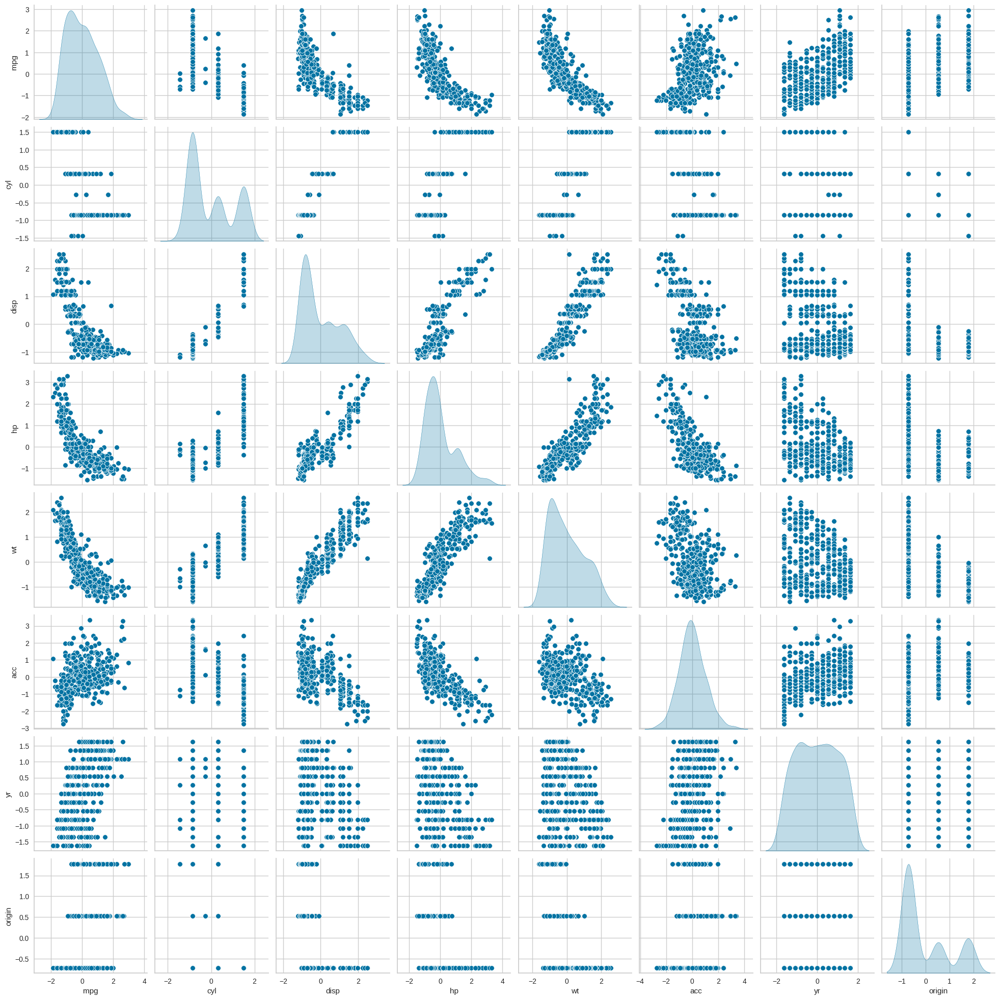

In [23]:
#zscore scalled data  and again visualize data 
df_car_dataScaled=df_car_data.apply(zscore)

sns.pairplot(df_car_dataScaled,diag_kind='kde')
plt.show()

In [24]:
df_car_dataScaled.shape


(398, 8)

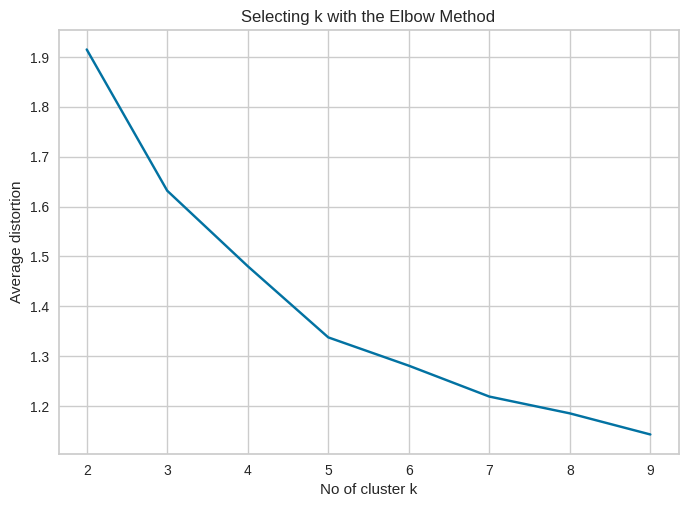

In [25]:
#Apply K-Means clustering for 2 to 10 clusters.
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters = range(2,10)
distortion_scores=[]
for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(df_car_dataScaled)
    prediction=model.predict(df_car_dataScaled)
    distortion_scores.append(sum(np.min(cdist(df_car_dataScaled, model.cluster_centers_, 'euclidean'), axis=1)) / df_car_dataScaled.shape[0])

plt.plot(clusters, distortion_scores, 'bx-')
plt.xlabel('No of cluster k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')
plt.show()


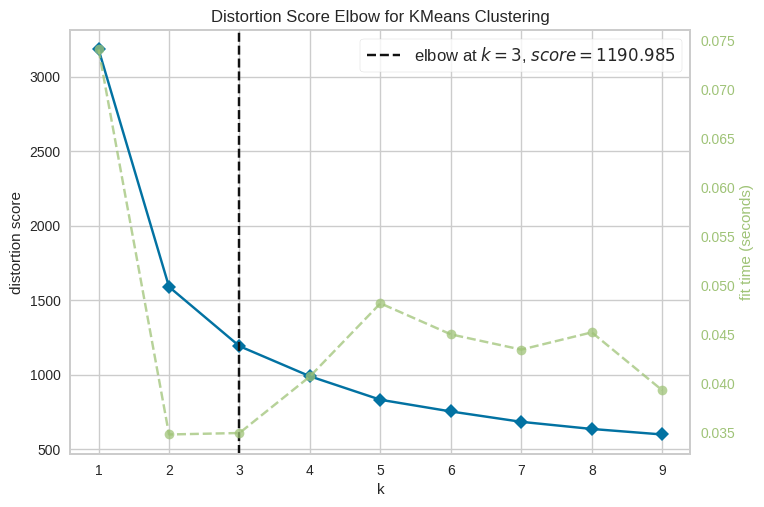

In [26]:
#k-mean Model elbow detection method and visulization
model = KMeans(3)
visualizer = KElbowVisualizer(model, k=(1,10))

# Fit the data to the visualizer
visualizer.fit(df_car_dataScaled)        
visualizer.show()
plt.show()

**In the plot above the elbow is at k=3 indicating the optimal k for this dataset is 3**

In [27]:
#Analyze the distribution of the data among the two groups (K = 3)
final_model=KMeans(3)
final_model.fit(df_car_dataScaled)
prediction=final_model.predict(df_car_dataScaled)

#Append the prediction 
df_car_data["group"] = prediction
df_car_dataScaled["group"] = prediction
print("Groups Assigned : \n")
df_car_data.head()

Groups Assigned : 



,mpg,cyl,disp,hp,wt,acc,yr,origin,group
0,18.0,8,307.0,130,3504,12.0,70,1,1
1,15.0,8,350.0,165,3693,11.5,70,1,1
2,18.0,8,318.0,150,3436,11.0,70,1,1
3,16.0,8,304.0,150,3433,12.0,70,1,1
4,17.0,8,302.0,140,3449,10.5,70,1,1


In [28]:
df_clust_group = df_car_data.groupby(['group'])
df_clust_group.mean()

,mpg,cyl,disp,hp,wt,acc,yr,origin
group,,,,,,,,
0,21.69562,5.240876,187.558394,95.204380,2990.861314,16.772263,76.313869,1.087591
1,14.71500,7.980000,346.370000,160.550000,4126.910000,12.721000,73.750000,1.000000
2,30.52795,4.068323,103.422360,77.503106,2234.720497,16.311801,77.155280,2.341615


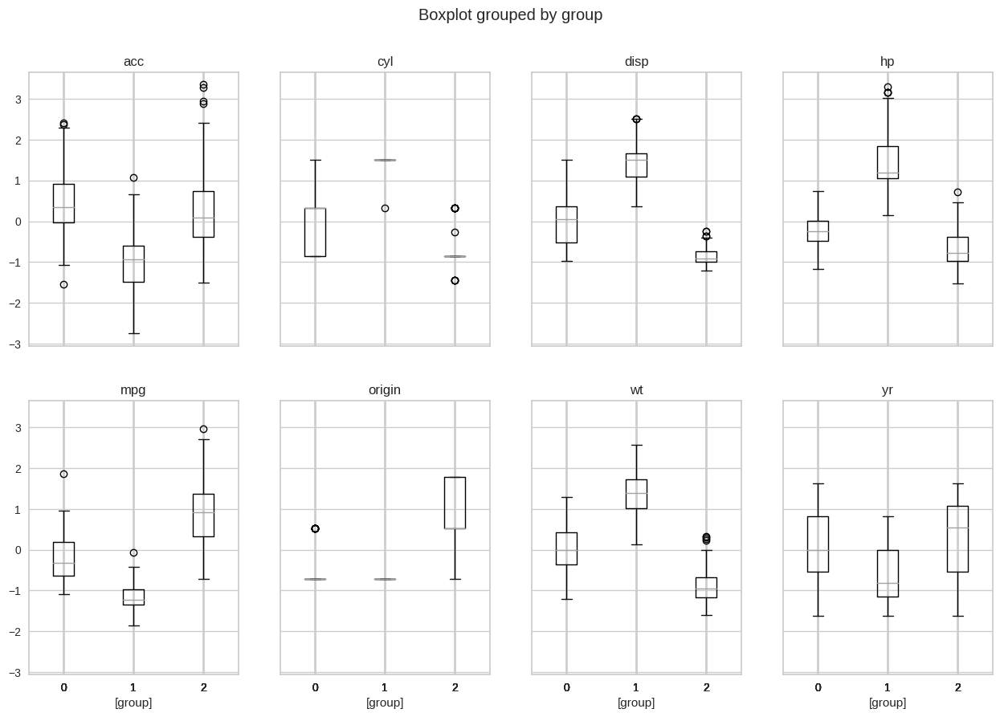

In [29]:
df_car_dataScaled.boxplot(by='group', layout = (2,4),figsize=(15,10))
plt.show()

In [30]:
#Analyze the distribution of the data among the two groups (K = 5)
df_car_dataScaled=df_car_data.apply(zscore)
final_model=KMeans(5)
final_model.fit(df_car_dataScaled)
prediction=final_model.predict(df_car_dataScaled)

#Append the prediction 
df_car_data["group"] = prediction
df_car_dataScaled["group"] = prediction
print("Groups Assigned : \n")
df_car_data.head()

Groups Assigned : 



,mpg,cyl,disp,hp,wt,acc,yr,origin,group
0,18.0,8,307.0,130,3504,12.0,70,1,3
1,15.0,8,350.0,165,3693,11.5,70,1,3
2,18.0,8,318.0,150,3436,11.0,70,1,3
3,16.0,8,304.0,150,3433,12.0,70,1,3
4,17.0,8,302.0,140,3449,10.5,70,1,3


In [31]:
df_support_clust = df_car_data.groupby(['group'])
df_support_clust.mean()

,mpg,cyl,disp,hp,wt,acc,yr,origin
group,,,,,,,,
0,19.161538,6.179487,231.474359,100.423077,3282.948718,16.707692,75.589744,1.038462
1,26.078667,4.026667,102.066667,82.440000,2245.760000,15.958667,73.853333,2.493333
2,24.837097,4.193548,137.411290,89.838710,2651.677419,16.782258,77.290323,1.145161
3,14.528866,7.979381,348.020619,161.804124,4143.969072,12.641237,73.628866,1.000000
4,34.408140,4.104651,104.604651,73.197674,2225.093023,16.619767,80.034884,2.209302


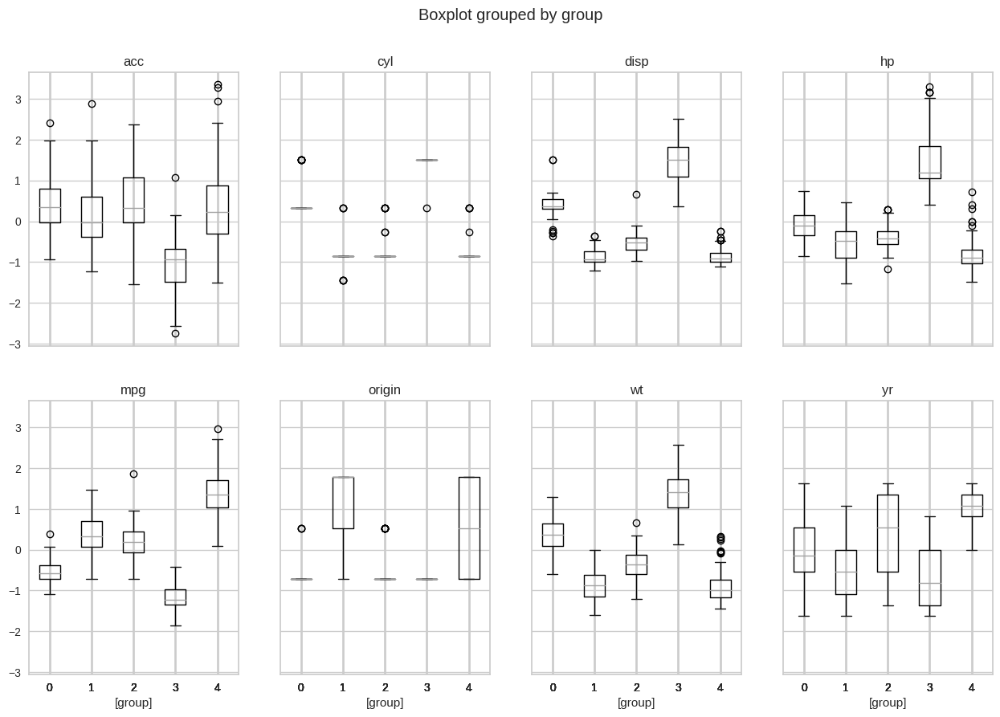

In [32]:
df_car_dataScaled.boxplot(by='group', layout = (2,4),figsize=(15,10))
plt.show()

Silhouette Score(n=3): 0.5864682427666144


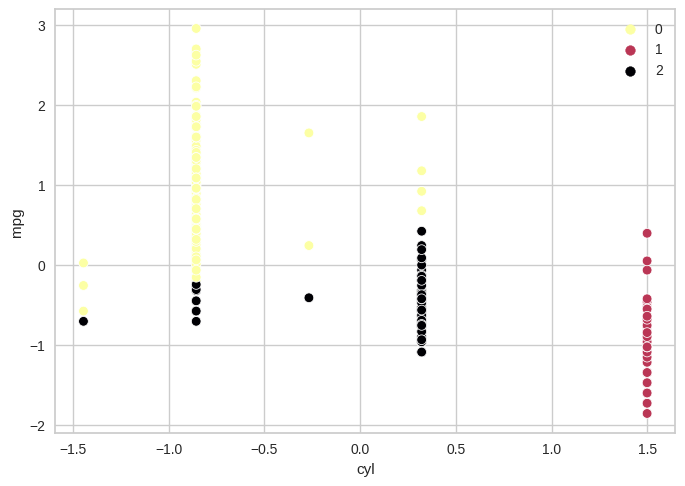

In [33]:
#removing none relation data for mile per galone 

df_scalled_cardata=df_car_data.apply(zscore)
df_scalled_cardata.pop('origin')
df_scalled_cardata.pop('group')
df_scalled_cardata.pop('yr')

#cylinders and mile per gallons silhoete score
target_mpg_cyl=df_scalled_cardata.iloc[:,0:2]
KMean= KMeans(n_clusters=3)
KMean.fit(target_mpg_cyl)
label=KMean.predict(target_mpg_cyl)
print("Silhouette Score(n=3):",silhouette_score(target_mpg_cyl, label)) 
sns.scatterplot(x=target_mpg_cyl['cyl'],y=target_mpg_cyl['mpg'],hue=label,palette='inferno_r')
plt.show()


/tmp/ipykernel_158128/266752916.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_mpg_disp['disp']=df_scalled_cardata['disp']


Silhouette Score(n=3): 0.4967710893857056


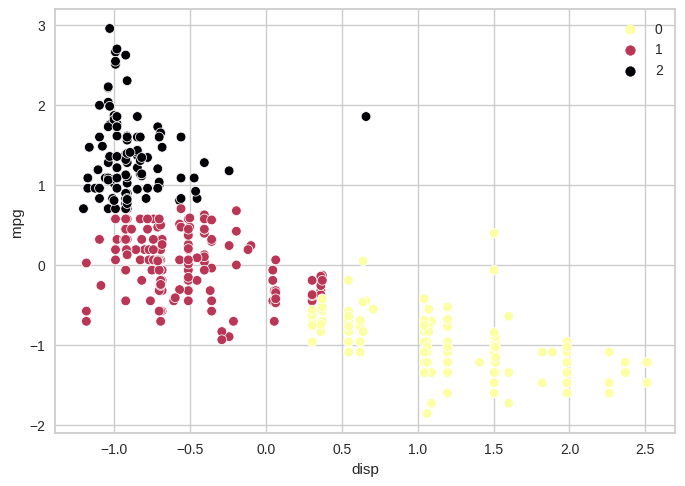

In [34]:
#displacement and  mile per gallons silhoete score visualization
target_mpg_disp=df_scalled_cardata.iloc[:,0:1]
target_mpg_disp['disp']=df_scalled_cardata['disp']

KMean= KMeans(n_clusters=3)
KMean.fit(target_mpg_disp)
label=KMean.predict(target_mpg_disp)

print("Silhouette Score(n=3):",silhouette_score(target_mpg_disp, label)) 
sns.scatterplot(x=target_mpg_disp['disp'],y=target_mpg_disp['mpg'],hue=label,palette='inferno_r')
plt.show()

/tmp/ipykernel_158128/764401071.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_mpg_acc['acc']=df_scalled_cardata['acc']


Silhouette Score(n=3): 0.3814342847802081


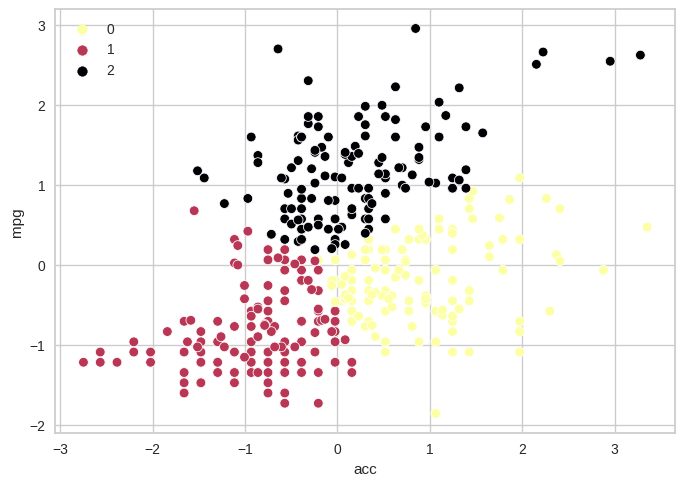

In [35]:
#accellearion and  mile per gallons silhoete score  datapoing visuliation
target_mpg_acc=df_scalled_cardata.iloc[:,0:1]
target_mpg_acc['acc']=df_scalled_cardata['acc']
KMean= KMeans(n_clusters=3)
KMean.fit(target_mpg_acc)
label=KMean.predict(target_mpg_acc)

print("Silhouette Score(n=3):",silhouette_score(target_mpg_acc, label)) 
sns.scatterplot(x=target_mpg_acc['acc'],y=target_mpg_acc['mpg'],hue=label,palette='inferno_r')
plt.show()

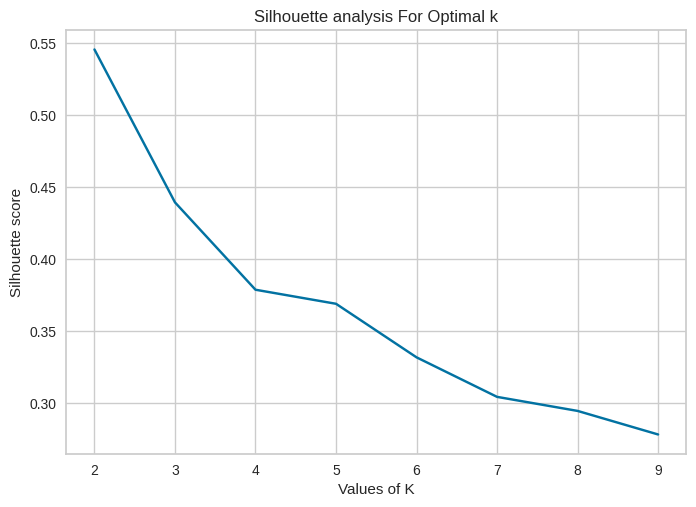

In [36]:
#To Finding Best silhusete score for optimal k Mean  analysis  Visualization
range_n_clusters = np.arange(2,10)
silhouette_avg = []
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmodel = KMeans(n_clusters=num_clusters)
    kmodel.fit(df_scalled_cardata)
    cluster_labels = kmodel.labels_
    #silhouette score
    silhouette_avg.append(silhouette_score(df_scalled_cardata, cluster_labels))

plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

Silhoueet score best K=3 showing the optimal point to view data  

## Part B

**DATA DESCRIPTION:** The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were
used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles
was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more dif icult to
distinguish between the cars.

In [37]:
import numpy as np   
from sklearn.linear_model import LinearRegression
import pandas as pd    
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from scipy.stats import zscore
from sklearn.decomposition import PCA

## 1. Data Understanding & Cleaning

In [38]:
#loading data understing data
#A. Read ‘vehicle.csv’ and save as DataFrame
df_vehicle = pd.read_csv("vehicle.csv")

In [39]:
df_vehicle

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car


In [40]:
print("shape of data",df_vehicle.shape)
df_vehicle.info()

shape of data (846, 19)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 

In [41]:
print("Count Summary \n \n",df_vehicle.count())
print("\n")
df_vehicle_sum = df_vehicle.sum()
print("\n",df_vehicle_sum)
print(df_vehicle.dtypes)

Count Summary 
 
 compactness                    846
circularity                    841
distance_circularity           842
radius_ratio                   840
pr.axis_aspect_ratio           844
max.length_aspect_ratio        846
scatter_ratio                  845
elongatedness                  845
pr.axis_rectangularity         843
max.length_rectangularity      846
scaled_variance                843
scaled_variance.1              844
scaled_radius_of_gyration      844
scaled_radius_of_gyration.1    842
skewness_about                 840
skewness_about.1               845
skewness_about.2               845
hollows_ratio                  846
class                          846
dtype: int64



 compactness                                                                79252
circularity                                                              37701.0
distance_circularity                                                     69137.0
radius_ratio                                             

In [42]:
#B.Check percentage of missing values and impute with correct approach
print("Is Null Value:", df_vehicle.isnull().values.any())
print("\n Count Null Value:", df_vehicle.isnull().sum().sum())
df_vehicle.isna().mean().round(4) * 100

Is Null Value: True

 Count Null Value: 41


compactness                    0.00
circularity                    0.59
distance_circularity           0.47
radius_ratio                   0.71
pr.axis_aspect_ratio           0.24
max.length_aspect_ratio        0.00
scatter_ratio                  0.12
elongatedness                  0.12
pr.axis_rectangularity         0.35
max.length_rectangularity      0.00
scaled_variance                0.35
scaled_variance.1              0.24
scaled_radius_of_gyration      0.24
scaled_radius_of_gyration.1    0.47
skewness_about                 0.71
skewness_about.1               0.12
skewness_about.2               0.12
hollows_ratio                  0.00
class                          0.00
dtype: float64

In [43]:
df_vehicle_after_impute_mean = df_vehicle.fillna(df_vehicle.mean())
df_vehicle_after_impute_mean

/tmp/ipykernel_158128/3245797053.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_vehicle_after_impute_mean = df_vehicle.fillna(df_vehicle.mean())


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car


In [44]:
#After fixising Null value fixing all value
print("\n Null Value :", df_vehicle_after_impute_mean.isnull().values.any())
print("\n Count Null Value:", df_vehicle_after_impute_mean.isnull().sum().sum())
print("\n shape of data: ", df_vehicle_after_impute_mean.shape)
print("====================================\n")
print(df_vehicle_after_impute_mean.count())
print("\n")
print(df_vehicle_after_impute_mean.isna().mean().round(4) * 100)
df_vehicle = df_vehicle_after_impute_mean


 Null Value : False

 Count Null Value: 0

 shape of data:  (846, 19)

compactness                    846
circularity                    846
distance_circularity           846
radius_ratio                   846
pr.axis_aspect_ratio           846
max.length_aspect_ratio        846
scatter_ratio                  846
elongatedness                  846
pr.axis_rectangularity         846
max.length_rectangularity      846
scaled_variance                846
scaled_variance.1              846
scaled_radius_of_gyration      846
scaled_radius_of_gyration.1    846
skewness_about                 846
skewness_about.1               846
skewness_about.2               846
hollows_ratio                  846
class                          846
dtype: int64


compactness                    0.0
circularity                    0.0
distance_circularity           0.0
radius_ratio                   0.0
pr.axis_aspect_ratio           0.0
max.length_aspect_ratio        0.0
scatter_ratio                  0.0
elo

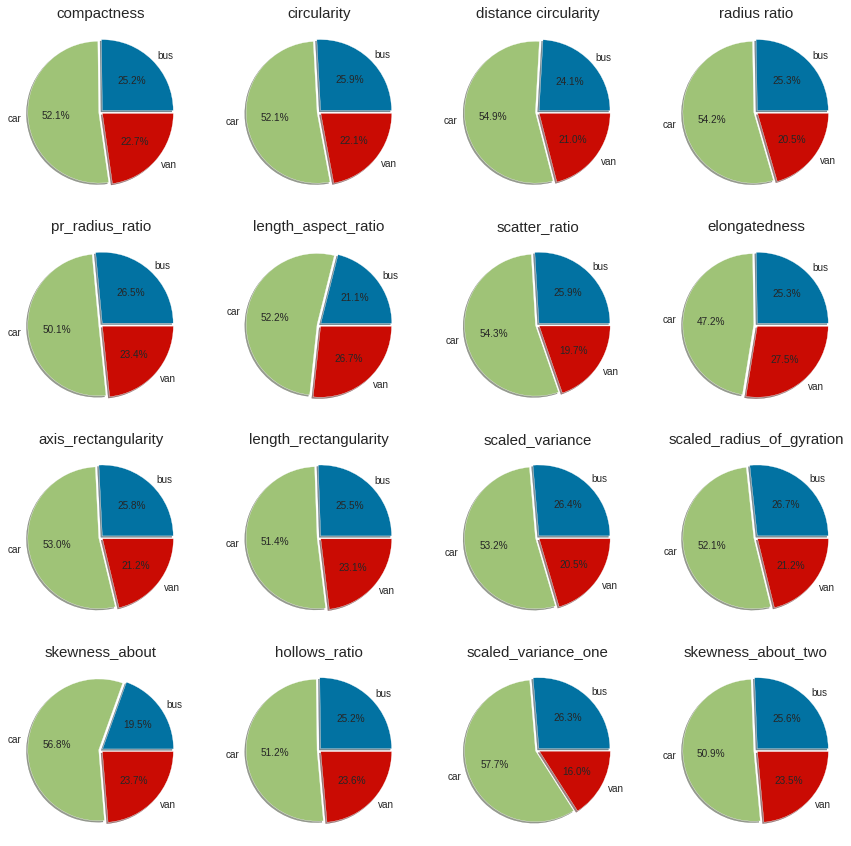

In [45]:
#C. Visualize a Pie-chart and print percentage of values for variable ‘class’
#Using matplotlib
df_vehicle_after_impute_mean.groupby('class').sum()

compactness = df_vehicle_after_impute_mean.groupby('class')['compactness'].sum() 
circularity = df_vehicle_after_impute_mean.groupby('class')['circularity'].sum() 
distance_circularity = df_vehicle_after_impute_mean.groupby('class')['distance_circularity'].sum() 
radius_ratio = df_vehicle_after_impute_mean.groupby('class')['radius_ratio'].sum() 

pr_radius_ratio = df_vehicle_after_impute_mean.groupby('class')['pr.axis_aspect_ratio'].sum() 
length_aspect_ratio = df_vehicle_after_impute_mean.groupby('class')['max.length_aspect_ratio'].sum() 
scatter_ratio = df_vehicle_after_impute_mean.groupby('class')['scatter_ratio'].sum() 
elongatedness = df_vehicle_after_impute_mean.groupby('class')['elongatedness'].sum() 

axis_rectangularity = df_vehicle_after_impute_mean.groupby('class')['pr.axis_rectangularity'].sum() 
length_rectangularity = df_vehicle_after_impute_mean.groupby('class')['max.length_rectangularity'].sum() 
scaled_variance = df_vehicle_after_impute_mean.groupby('class')['scaled_variance'].sum() 
scaled_variance_one = df_vehicle_after_impute_mean.groupby('class')['scaled_variance.1'].sum()


scaled_radius_of_gyration = df_vehicle_after_impute_mean.groupby('class')['scaled_radius_of_gyration'].sum()
skewness_about = df_vehicle_after_impute_mean.groupby('class')['skewness_about'].sum()
skewness_about_two = df_vehicle_after_impute_mean.groupby('class')['skewness_about.2'].sum()

hollows_ratio = df_vehicle_after_impute_mean.groupby('class')['hollows_ratio'].sum() 

labels= compactness.keys()
fig, ax = plt.subplots(4,4,figsize=[15,15])

ax[0,0].pie(compactness,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[0,0].set_title("compactness", fontsize=15)

ax[0,1].pie(circularity,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[0,1].set_title("circularity", fontsize=15)

ax[0,2].pie(distance_circularity,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[0,2].set_title("distance circularity", fontsize=15)

ax[0,3].pie(radius_ratio,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[0,3].set_title("radius ratio", fontsize=15)

ax[1,0].pie(pr_radius_ratio,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[1,0].set_title("pr_radius_ratio", fontsize=15)

ax[1,1].pie(length_aspect_ratio,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[1,1].set_title("length_aspect_ratio", fontsize=15)

ax[1,2].pie(scatter_ratio,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[1,2].set_title("scatter_ratio", fontsize=15)

ax[1,3].pie(elongatedness,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[1,3].set_title("elongatedness", fontsize=15)

ax[2,0].pie(axis_rectangularity,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[2,0].set_title("axis_rectangularity", fontsize=15)

ax[2,1].pie(length_rectangularity,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[2,1].set_title("length_rectangularity", fontsize=15)

ax[2,2].pie(scaled_variance,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[2,2].set_title("scaled_variance", fontsize=15)

ax[2,3].pie(scaled_radius_of_gyration,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[2,3].set_title("scaled_radius_of_gyration", fontsize=15)

ax[3,0].pie(skewness_about,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[3,0].set_title("skewness_about", fontsize=15)

ax[3,1].pie(hollows_ratio,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[3,1].set_title("hollows_ratio", fontsize=15)

ax[3,2].pie(scaled_variance_one,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[3,2].set_title("scaled_variance_one", fontsize=15)

ax[3,3].pie(skewness_about_two,labels=labels, autopct='%1.1f%%',shadow=True, explode=[.03]*3 )
ax[3,3].set_title("skewness_about_two", fontsize=15)

plt.show()

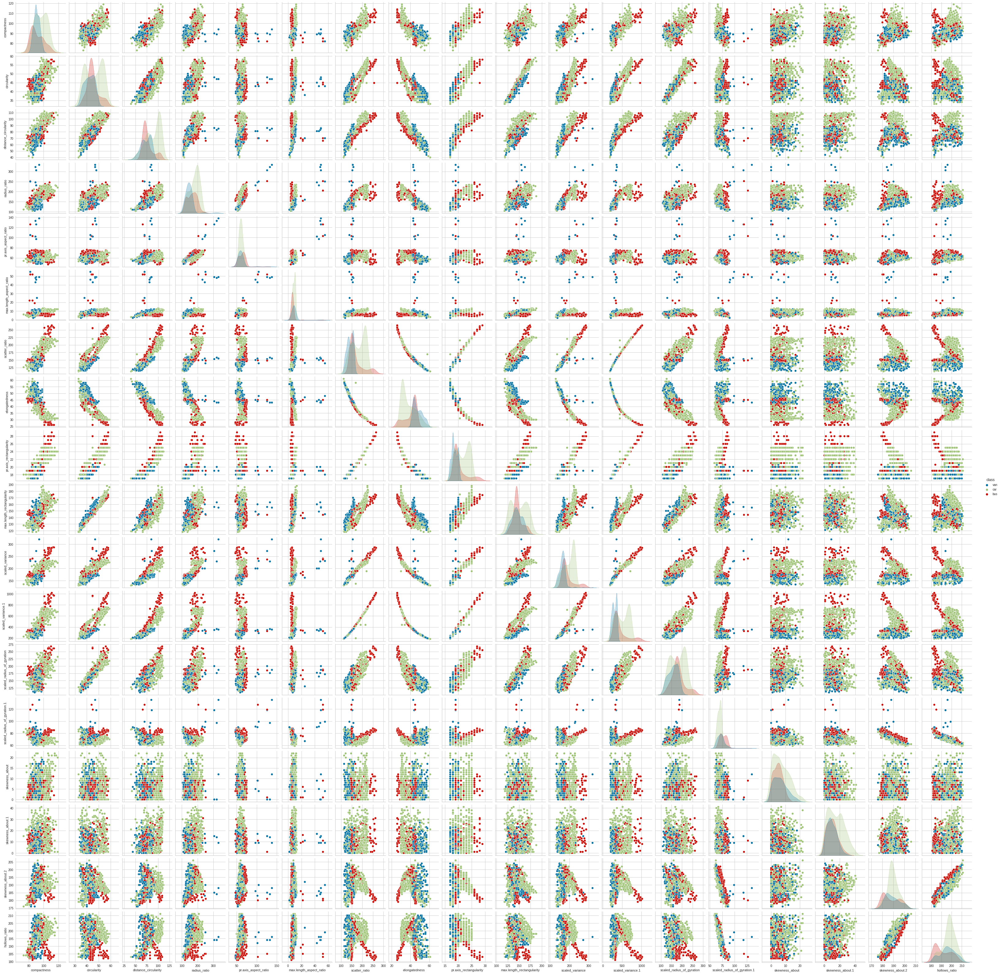

In [46]:
#Hue the class Veriable all data visualize 
cols=df_vehicle.columns
df_dataX = df_vehicle.iloc[:,0:18]
sns.pairplot(df_vehicle, hue='class')
plt.show()

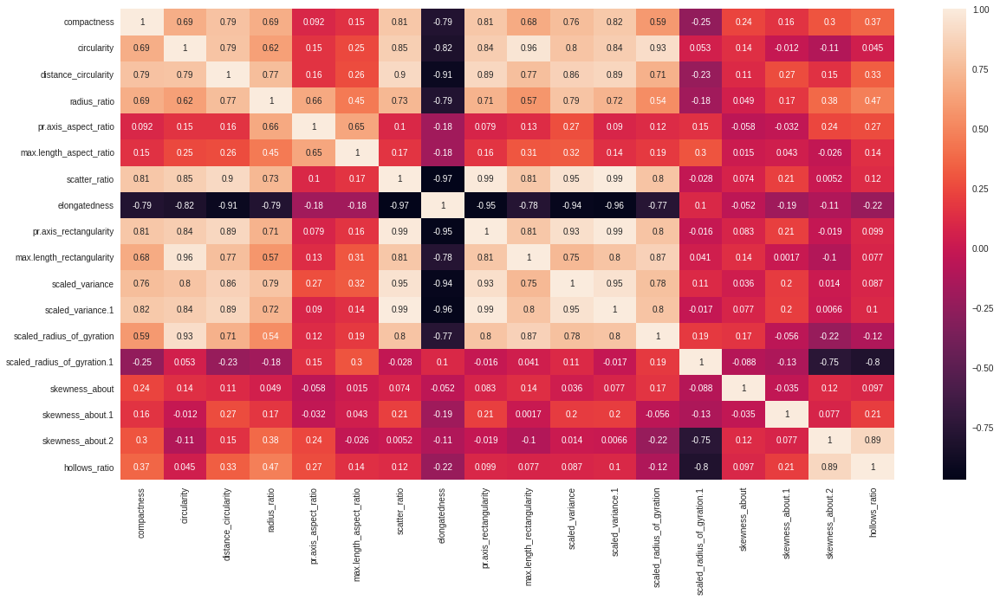

In [47]:
#under stading data 

plt.figure(figsize=(20,10)) 
sns.heatmap(df_dataX.corr(), annot=True)
plt.show()

In [48]:
#D. Check for duplicate rows in the data and impute with correct approach
duplicate_row= df_vehicle[df_vehicle.duplicated()]
print("Duplicate Rows :")
# Print the resultant Dataframe
duplicate_row.count()

Duplicate Rows :


compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

## Data Preparation  Train and test

In [49]:
#A. Split data into X and Y. [Train and Test optional]
X = df_vehicle.iloc[:,0:18]
y = df_vehicle.iloc[:,18:]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [50]:
#B. Standardize the Data
dataScale= StandardScaler()
# fit and transform the data
scaled_data = dataScale.fit_transform(X)
trainX_data_scaled = dataScale.fit_transform(X_train)
testX_data_scaled = dataScale.fit_transform(X_test)


In [51]:
#standard scall data
print(scaled_data)
print("")
print(trainX_data_scaled)
print("")
print(testX_data_scaled)


[[ 0.16058035  0.51730193  0.05654535 ...  0.38066534 -0.31219283
   0.18395733]
 [-0.32546965 -0.62456401  0.12011169 ...  0.15658856  0.01308823
   0.45297703]
 [ 1.25419283  0.84354934  1.51857115 ... -0.40360337 -0.1495523
   0.04944748]
 ...
 [ 1.49721783  1.49604417  1.20073946 ... -0.96379531 -0.31219283
   0.72199673]
 [-0.93303214 -1.44018254 -0.26128634 ...  1.38901082  0.17572877
  -0.08506238]
 [-1.05454464 -1.44018254 -1.02408241 ...  0.60474211 -0.47483337
  -0.75761164]]

[[ 1.52092954  1.34225888  0.99951429 ...  0.92058317 -0.15780587
   0.14652241]
 [-2.51889093 -1.2704474  -1.8299072  ...  0.24587348 -2.08427991
  -1.607189  ]
 [ 0.54157913  1.66884717  1.62827461 ...  1.93264769 -0.31834537
   0.28142328]
 ...
 [-1.41712171  0.03590574 -0.8867667  ... -1.44090072 -1.28158239
  -1.607189  ]
 [-1.0498653  -1.2704474  -0.8867667  ...  0.13342187  0.96597066
   0.95592767]
 [ 0.05190392 -0.45397669 -0.8867667  ... -0.87864265  0.48435215
   0.01162153]]

[[-1.54420793  

## Model score Printing method

In [52]:
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n=======================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n {clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result: \n=============================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: n {confusion_matrix(y_test, pred)}\n")


In [53]:
#A. Train a base Classi ication model using SVM.
model = SVC(kernel='poly', degree=2, gamma='auto', coef0=1, C=5)
model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              bus    car    van  accuracy  macro avg  weighted avg
precision    1.0    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0    1.0       1.0        1.0           1.0
support    140.0  311.0  141.0       1.0      592.0         592.0
_______________________________________________
Confusion Matrix: 
 [[140   0   0]
 [  0 311   0]
 [  0   0 141]]

Test Result: 
Accuracy Score: 95.67%
_______________________________________________
CLASSIFICATION REPORT:n                 bus         car        van  accuracy   macro avg  \
precision   0.938272    0.974359   0.946429  0.956693    0.953020   
recall      0.974359    0.966102   0.913793  0.956693    0.951418   
f1-score    0.955975    0.970213   0.929825  0.956693    0.952004   
support    78.000000  118.000000  58.000000  0.956693  254.00

/home/ubuntu/pyworkspace/mlpython/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [54]:
#B. Print Classi ication metrics for train data.
model = SVC(kernel='rbf', gamma=0.5, C=0.1)
model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 52.53%
_______________________________________________
CLASSIFICATION REPORT:
              bus         car    van  accuracy   macro avg  weighted avg
precision    0.0    0.525338    0.0  0.525338    0.175113      0.275980
recall       0.0    1.000000    0.0  0.525338    0.333333      0.525338
f1-score     0.0    0.688815    0.0  0.525338    0.229605      0.361861
support    140.0  311.000000  141.0  0.525338  592.000000    592.000000
_______________________________________________
Confusion Matrix: 
 [[  0 140   0]
 [  0 311   0]
 [  0 141   0]]

Test Result: 
Accuracy Score: 46.46%
_______________________________________________
CLASSIFICATION REPORT:n            bus         car   van  accuracy   macro avg  weighted avg
precision   0.0    0.464567   0.0  0.464567    0.154856      0.215822
recall      0.0    1.000000   0.0  0.464567    0.333333      0.464567
f1-score    0.0    0.634409   0.0  0.464567    0.211470      0.294725
support    78.0  118.000000 

/home/ubuntu/pyworkspace/mlpython/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ubuntu/pyworkspace/mlpython/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ubuntu/pyworkspace/mlpython/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ubuntu/pyworkspace/mlpython/lib/python

In [55]:
#C. Apply PCA on the data with 10 components
pca = PCA(n_components=5)
pca.fit(scaled_data)
Xpca10 = pca.transform(scaled_data) 

In [56]:
print(pca.explained_variance_)
print("")
print(pca.components_)
print("")
print(pca.explained_variance_ratio_)

[9.40828822 3.01605477 1.90347881 1.18027268 0.91717407]

[[ 2.75259459e-01  2.93392341e-01  3.04556452e-01  2.67593206e-01
   8.04938998e-02  9.72198560e-02  3.16872006e-01 -3.14042361e-01
   3.13953009e-01  2.82790417e-01  3.09310530e-01  3.14149034e-01
   2.72002525e-01 -2.09179819e-02  4.13316728e-02  5.83331566e-02
   3.01560495e-02  7.40813666e-02]
 [-1.27010856e-01  1.26217125e-01 -7.26862818e-02 -1.89635192e-01
  -1.22158741e-01  1.07277825e-02  4.80473095e-02  1.27991503e-02
   6.00351423e-02  1.16182501e-01  6.17536908e-02  5.32757796e-02
   2.09279660e-01  4.88541866e-01 -5.49212020e-02 -1.24152855e-01
  -5.40947666e-01 -5.40279812e-01]
 [-1.19874162e-01 -2.51835016e-02 -5.60058748e-02  2.75066087e-01
   6.42046458e-01  5.91799912e-01 -9.76530949e-02  5.74645766e-02
  -1.09509169e-01 -1.69994013e-02  5.64656174e-02 -1.08711428e-01
  -3.13685231e-02  2.86211092e-01 -1.15693651e-01 -7.54878378e-02
   8.68929276e-03  3.95143108e-02]
 [ 7.83109159e-02  1.87525529e-01 -7.07959698

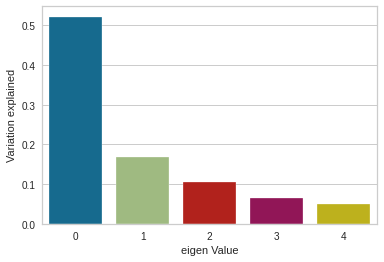

In [57]:
#PCA Ration Visualiation
pc_val=list(pca.explained_variance_ratio_)
lbl=list(np.arange(0,5))
bar_df=pd.DataFrame({'pac_val_ratio': pc_val, 'label':lbl})
sns.barplot(x = 'label',y = 'pac_val_ratio',data = bar_df)
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

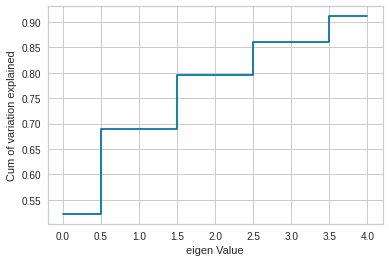

In [58]:
pc_val=np.cumsum(pca.explained_variance_ratio_)
lbl=list(np.arange(0,5))
plt.step(lbl,pc_val, where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()


Text(0, 0.5, 'Second Principal Component')

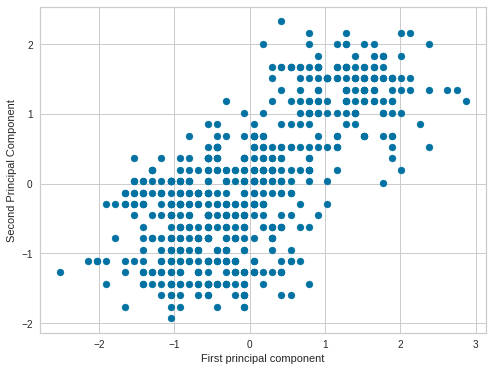

In [59]:
#D. Visualize Cumulative Variance Explained with Number of Components
scaler = StandardScaler()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
plt.figure(figsize=(8,6))
plt.scatter(X_train[:,0],X_train[:,1],cmap='plasma')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

In [60]:
#E. Draw a horizontal line on the above plot to highlight the threshold of 90%
print(pca.explained_variance_)

[9.40828822 3.01605477 1.90347881 1.18027268 0.91717407]


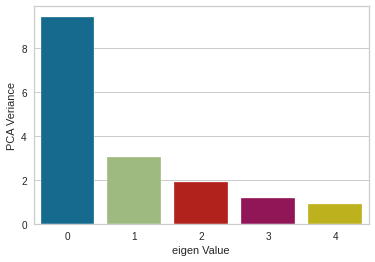

In [61]:
#PCA Veriance Visualiation
#F. Apply PCA on the data. This time Select Minimum Components with 90% or above variance explained
veriance_val=list(pca.explained_variance_)
lbl=list(np.arange(0,5))
df_pca_veriance=pd.DataFrame({'pca_veriance': veriance_val, 'label':lbl})
sns.barplot(x = 'label',y = 'pca_veriance',data = df_pca_veriance)
plt.ylabel('PCA Veriance')
plt.xlabel('eigen Value')
plt.show()

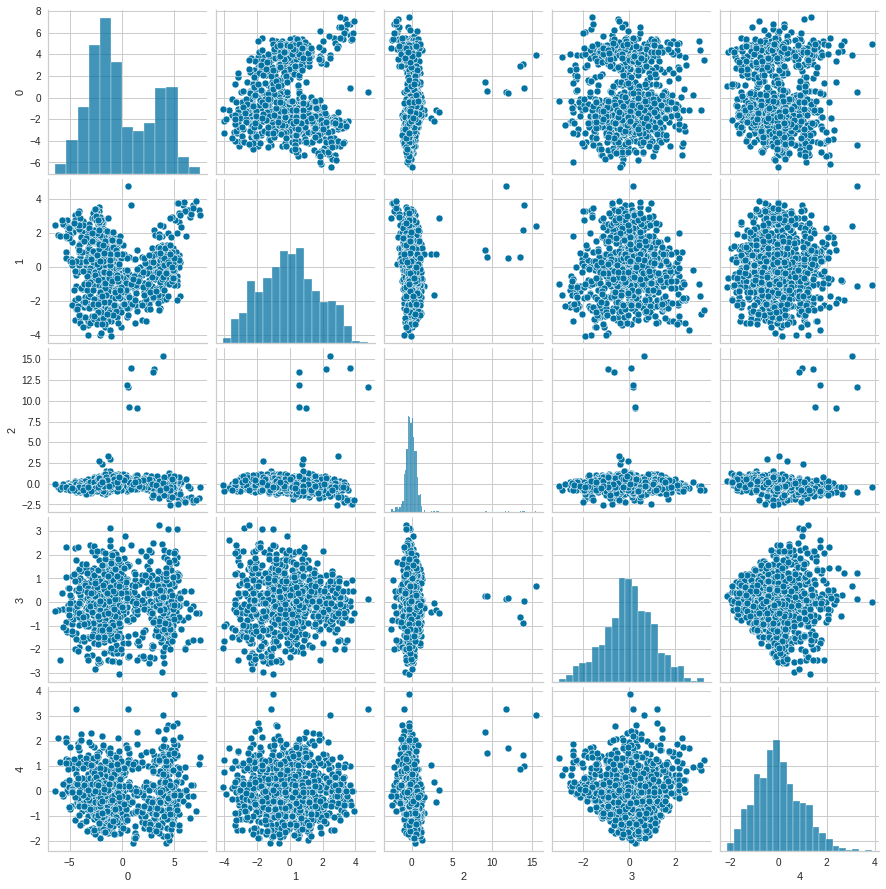

In [62]:
sns.pairplot(pd.DataFrame(Xpca10))
plt.show()

In [63]:
#G. Train SVM model on components selected from above step
#again split data
X = df_vehicle.iloc[:,0:18]
y = df_vehicle.iloc[:,18:]

#Normalize data x data
XScaled=X.apply(zscore)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#Model applyed scalled data
svm_model = SVC()
svm_model.fit(XScaled, y)
svm_model.score(XScaled, y)

/home/ubuntu/pyworkspace/mlpython/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.9810874704491725

In [64]:
#classification Reports svc model
print(classification_report(y, svm_model.predict(XScaled)))

              precision    recall  f1-score   support

         bus       0.99      0.98      0.98       218
         car       0.99      0.98      0.99       429
         van       0.95      0.98      0.97       199

    accuracy                           0.98       846
   macro avg       0.98      0.98      0.98       846
weighted avg       0.98      0.98      0.98       846



In [65]:
#H. Print Classi ication metrics for train data of above model and share insights
svc_model_pca = SVC()
svc_model_pca.fit(Xpca10, y)
svc_model_pca.score(Xpca10, y)

/home/ubuntu/pyworkspace/mlpython/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.806146572104019

In [66]:
#PCA Data Classification Reports 
print(classification_report(y, svc_model_pca.predict(Xpca10)))

              precision    recall  f1-score   support

         bus       0.85      0.68      0.76       218
         car       0.84      0.89      0.87       429
         van       0.70      0.76      0.73       199

    accuracy                           0.81       846
   macro avg       0.80      0.78      0.78       846
weighted avg       0.81      0.81      0.80       846



In [67]:
#A. Train another SVM on the components out of PCA. Tune the parameters to improve performance
svm_model = SVC(kernel='rbf', gamma=0.5, C=10)
svm_model.fit(XScaled, y)
print("Normal SVM Prameter")
print("score :",svm_model.score(XScaled, y))
#classification Reports svc model
print("\n",classification_report(y, svm_model.predict(XScaled)))

Normal SVM Prameter
score : 1.0

               precision    recall  f1-score   support

         bus       1.00      1.00      1.00       218
         car       1.00      1.00      1.00       429
         van       1.00      1.00      1.00       199

    accuracy                           1.00       846
   macro avg       1.00      1.00      1.00       846
weighted avg       1.00      1.00      1.00       846



/home/ubuntu/pyworkspace/mlpython/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [68]:
#PCA Model SVM Prameter change
svc_model_pca = SVC(kernel='rbf', gamma=0.5, C=10)
svc_model_pca.fit(Xpca10, y)
print("PCA  SVM Prameter Change")
print("score :",svc_model_pca.score(Xpca10, y))
#classification Reports svc model
print("\n",classification_report(y, svc_model_pca.predict(Xpca10)))

PCA  SVM Prameter Change
score : 0.9739952718676123

               precision    recall  f1-score   support

         bus       0.95      0.97      0.96       218
         car       0.98      0.99      0.98       429
         van       0.98      0.94      0.96       199

    accuracy                           0.97       846
   macro avg       0.97      0.97      0.97       846
weighted avg       0.97      0.97      0.97       846



/home/ubuntu/pyworkspace/mlpython/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


## Explain pre-requisite/assumptions of PCA

**Principle Component Analysis:**
A statistical technique used to
examine the interrelations among a set of variables in order
to identify the underlying structure of those variables. Also
called factor analysis

**1. Linearity**
Assumes the data set to be linear combinations of
the variables.

**2. The importance of mean and covariance**
There is no guarantee that the directions of maximum
variance will contain good features for discrimination.

**3. That large variances have important dynamics**
Assumes that components with larger variance
correspond to interesting dynamics and lower ones
correspond to noise.

## Explain advantages and limitations of PCA

**1. Removes Correlated Features:**
In a real world scenario, this is very common that you get thousands of features in your dataset. You cannot run your algorithm on all the features as it will reduce the performance of your algorithm and it will not be easy to visualize that many features in any kind of graph. So, you MUST reduce the number of features in your dataset. 

You need to find out the correlation among the features (correlated variables). Finding correlation manually in thousands of features is nearly impossible, frustrating and time-consuming. PCA does this for you efficiently.

After implementing the PCA on your dataset, all the Principal Components are independent of one another. There is no correlation among them.

**2. Improves Algorithm Performance:**
With so many features, the performance of your algorithm will drastically degrade. PCA is a very common way to speed up your Machine Learning algorithm by getting rid of correlated variables which don't contribute in any decision making. The training time of the algorithms reduces significantly with less number of features.

So, if the input dimensions are too high, then using PCA to speed up the algorithm is a reasonable choice. 

**3.Reduces Overfitting:**
Overfitting mainly occurs when there are too many variables in the dataset. So, PCA helps in overcoming the overfitting issue by reducing the number of features.

**4.Improves Visualization:**
It is very hard to visualize and understand the data in high dimensions. PCA transforms a high dimensional data to low dimensional data (2 dimension) so that it can be visualized easily. 

**Limitation of PCA is**
1) PCA is not robust against outliers

2) PCA assumes a linear relationship between features

3) PCA assumes a correlation between features